In [7]:
import squidpy as sq
import cellcharter as cc
import scanpy as sc
import numpy as np
from lightning.pytorch import seed_everything
seed_everything(0)

Seed set to 0


0

In [10]:
! curl -L --fail -o ../data/codex_mouse_spleen.h5ad https://ndownloader.figshare.com/files/38538101


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  151M  100  151M    0     0  4585k      0  0:00:33  0:00:33 --:--:-- 6636k:00:44  0:00:19  0:00:25 5032k298k      0  0:00:36  0:00:29  0:00:07 6130k


In [3]:
import cellcharter as cc
adata = cc.datasets.codex_mouse_spleen("../data/codex_mouse_spleen.h5ad")
adata


AnnData object with n_obs × n_vars = 707474 × 29
    obs: 'cell_type', 'i-niche', 'tile', 'area', 'dataset', 'stage', 'sample'
    uns: 'spatial', 'spatial_cluster_colors'
    obsm: 'blanks', 'spatial'

In [4]:
adata

AnnData object with n_obs × n_vars = 707474 × 29
    obs: 'cell_type', 'i-niche', 'tile', 'area', 'dataset', 'stage', 'sample'
    uns: 'spatial', 'spatial_cluster_colors'
    obsm: 'blanks', 'spatial'

In [5]:
adata.raw = adata.copy()
for sample in adata.obs['sample'].cat.categories:
    adata.X[adata.obs['sample'] == sample, :] = sc.pp.scale(adata[adata.obs['sample'] == sample], copy=True).X

In [6]:
sq.gr.spatial_neighbors(adata, library_key='sample', coord_type='generic', delaunay=True)


In [7]:
cc.gr.remove_long_links(adata)


In [8]:
cc.gr.aggregate_neighbors(adata, n_layers=3)


100%|██████████| 9/9 [00:06<00:00,  1.40it/s]


In [14]:
# GMM components to try
# GMM components to try
gmm_components = [15,20]



In [15]:
from sklearn.mixture import GaussianMixture
import pandas as pd

X = adata.obsm['X_cellcharter']
gmm_results = []

for k in gmm_components:
    gmm = GaussianMixture(
        n_components=k,
        covariance_type='full',
        random_state=0,
        n_init=3,
    )
    labels = gmm.fit_predict(X)
    key = f'CellCharter_{k}'
    adata.obs[key] = labels.astype(str)
    gmm_results.append({
        'k': k,
        'bic': gmm.bic(X),
        'aic': gmm.aic(X),
    })
    n_clusters = adata.obs[key].nunique()
    print(f'k={k}: {n_clusters} clusters')

gmm_scores = pd.DataFrame(gmm_results).sort_values('bic')
best_k = int(gmm_scores.iloc[0]['k'])
gmm_best_key = f'gmm_mana_{best_k}'
print(f'Best k by BIC: {best_k} -> {gmm_best_key}')


/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:237: RuntimeWarning: divide by zero encountered in matmul
  current_pot = closest_dist_sq @ sample_weight
/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:237: RuntimeWarning: overflow encountered in matmul
  current_pot = closest_dist_sq @ sample_weight
/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3

k=15: 15 clusters


/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:237: RuntimeWarning: divide by zero encountered in matmul
  current_pot = closest_dist_sq @ sample_weight
/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:237: RuntimeWarning: overflow encountered in matmul
  current_pot = closest_dist_sq @ sample_weight
/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3

k=20: 20 clusters
Best k by BIC: 20 -> gmm_mana_20


In [14]:
adata.obs["sample_id"] = adata.obs["sample"].astype("category")
adata.obsm["spatial"] = adata.obsm["spatial"].copy()


In [13]:
adata.obsm

AxisArrays with keys: blanks, spatial, X_cellcharter

In [17]:
import sys
sys.path.append("/Users/christoffer/work/karolinska/development/MANA")
from utils import aggregate_neighbors_weighted, plot_spatial_compact_fast

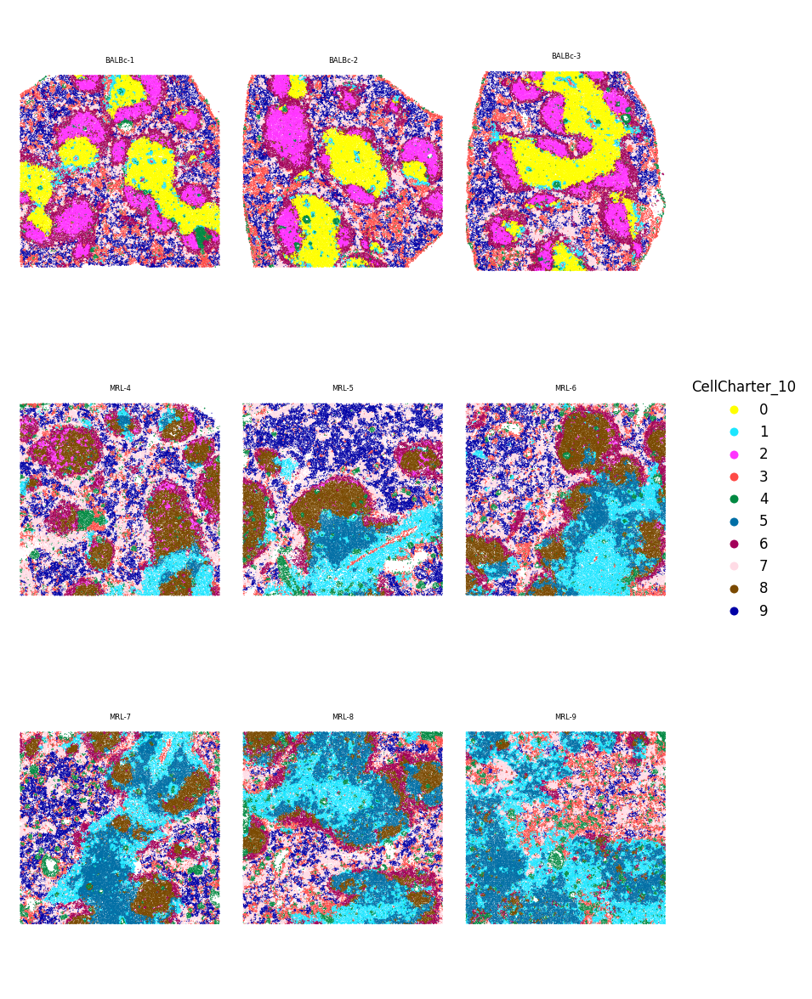

In [18]:
plot_spatial_compact_fast(
    adata,
    color="CellCharter_10",
    groupby="sample_id",
    spot_size=0.5,
    cols=3,
    height=10,
    background="white",
    dpi=120,
)


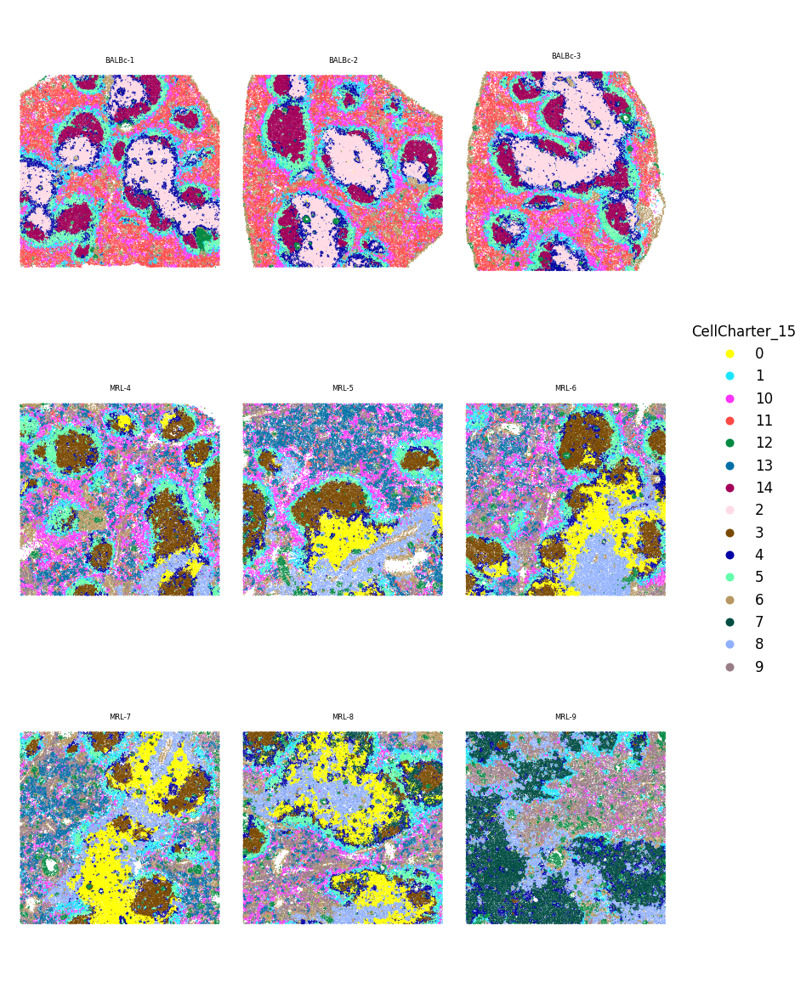

In [19]:
plot_spatial_compact_fast(
    adata,
    color="CellCharter_15",
    groupby="sample_id",
    spot_size=0.5,
    cols=3,
    height=10,
    background="white",
    dpi=120,
)


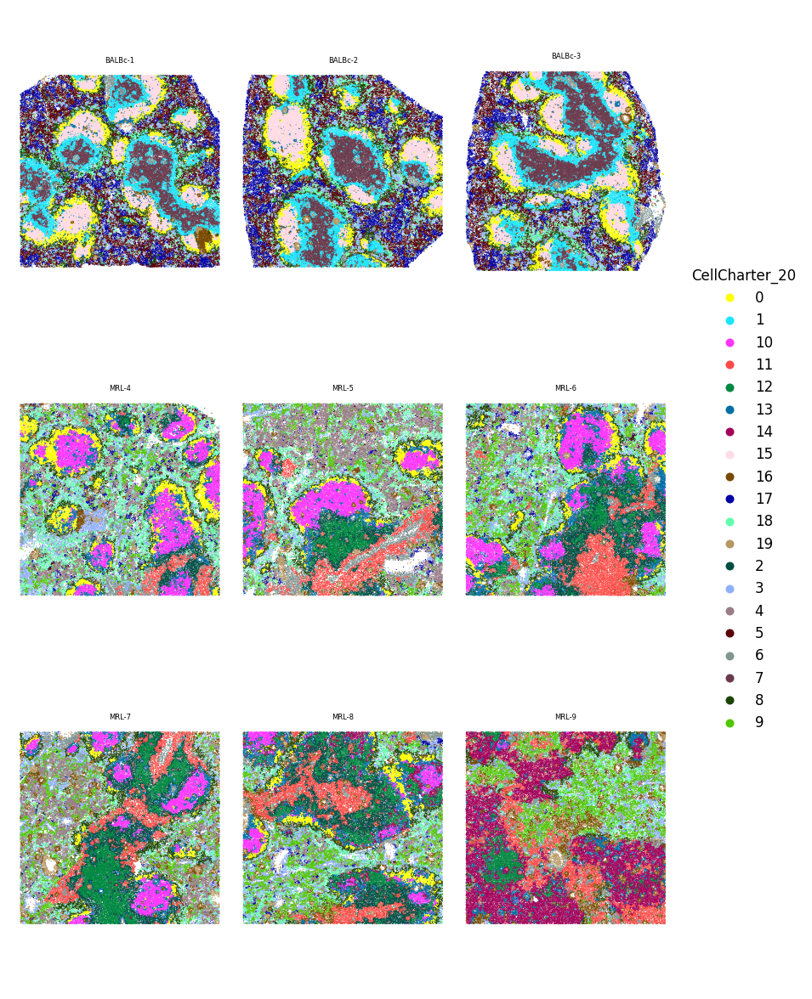

In [20]:
plot_spatial_compact_fast(
    adata,
    color="CellCharter_20",
    groupby="sample_id",
    spot_size=0.5,
    cols=3,
    height=10,
    background="white",
    dpi=120,
)


In [23]:
adata.write('/Volumes/processing2/KaroSpaceDataWrangle/codex2.h5ad')

In [2]:
adata = sc.read_h5ad('/Volumes/processing2/KaroSpaceDataWrangle/codex2.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 707474 × 29
    obs: 'cell_type', 'i-niche', 'tile', 'area', 'dataset', 'stage', 'sample', 'CellCharter_10', 'sample_id', 'CellCharter_15', 'CellCharter_20'
    var: 'highly_variable'
    uns: 'CellCharter_10_colors', 'CellCharter_15_colors', 'CellCharter_20_colors', 'spatial', 'spatial_cluster_colors', 'spatial_neighbors'
    obsm: 'X_cellcharter', 'blanks', 'spatial'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [6]:
adata.X = np.nan_to_num(adata.X, nan=0.0, posinf=0.0, neginf=0.0)

AttributeError: 'numpy.ndarray' object has no attribute 'fillna'

In [55]:
adata.X = adata.raw.X

In [4]:
adata

AnnData object with n_obs × n_vars = 707474 × 29
    obs: 'cell_type', 'i-niche', 'tile', 'area', 'dataset', 'stage', 'sample', 'CellCharter_10', 'sample_id', 'CellCharter_15', 'CellCharter_20'
    var: 'highly_variable'
    uns: 'CellCharter_10_colors', 'CellCharter_15_colors', 'CellCharter_20_colors', 'spatial', 'spatial_cluster_colors', 'spatial_neighbors'
    obsm: 'X_cellcharter', 'blanks', 'spatial'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [46]:
adata.layers["counts"] = adata.X

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)


/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)
/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:391: RuntimeWarning: invalid value encountered in log1p
  np.log1p(x, out=x)


In [57]:
for sample in adata.obs['sample'].cat.categories:
    adata.X[adata.obs['sample'] == sample, :] = sc.pp.scale(adata[adata.obs['sample'] == sample], copy=True).X

In [4]:
import scanpy as sc

/Users/christoffer/miniconda3/envs/cellcharter310/lib/python3.10/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [9]:
adata = sc.read_h5ad('/Volumes/processing2/KaroSpaceDataWrangle/h5ad/codex.h5ad')

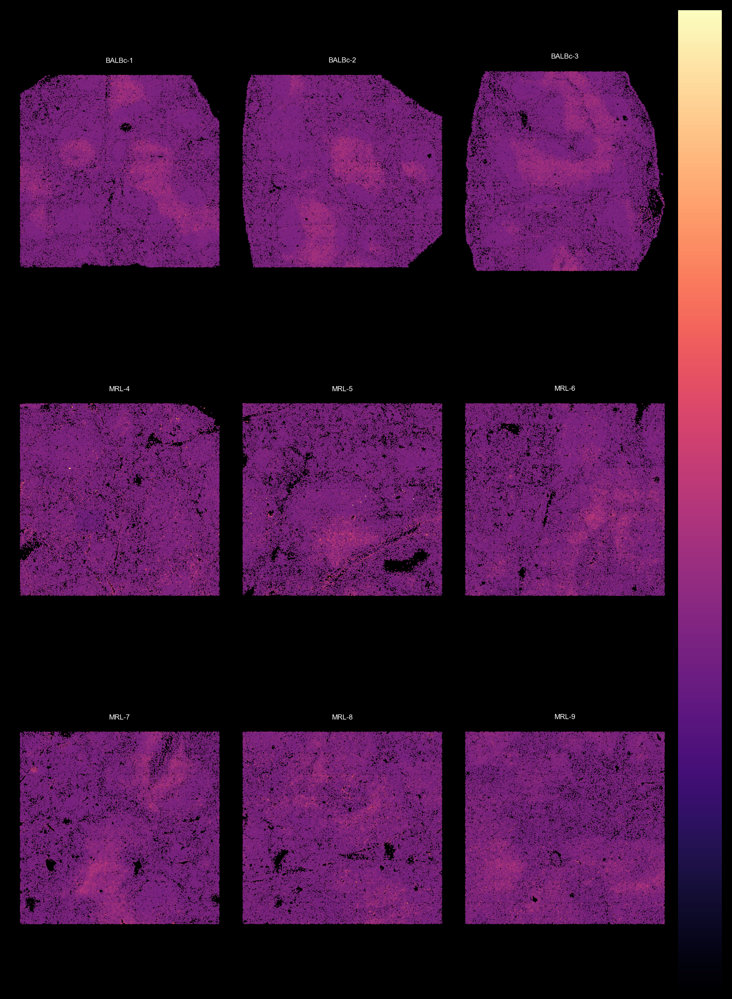

In [64]:
plot_spatial_compact_fast(
    adata,
    color="CD90",
    groupby="sample_id",
    spot_size=0.5,
    cols=3,
    height=10,
    background="black",
    dpi=120,
    palette ='magma'
)


In [67]:
adata.obs

,cell_type,i-niche,tile,area,dataset,stage,sample,CellCharter_10,sample_id
0,CD11c(+) B cells,50.0,5.0,9258.0,codex_mouse_spleen,BALBc,BALBc-1,0,BALBc-1
1,CD11c(+) B cells,88.0,14.0,11897.0,codex_mouse_spleen,BALBc,BALBc-1,6,BALBc-1
2,CD11c(+) B cells,84.0,18.0,1500.0,codex_mouse_spleen,BALBc,BALBc-1,9,BALBc-1
3,CD11c(+) B cells,59.0,4.0,9219.0,codex_mouse_spleen,BALBc,BALBc-1,0,BALBc-1
4,CD11c(+) B cells,88.0,19.0,5637.0,codex_mouse_spleen,BALBc,BALBc-1,3,BALBc-1
...,...,...,...,...,...,...,...,...,...
79343-4,CD4(+)MHCII(+),92.0,41.0,8467.0,codex_mouse_spleen,late MRL,MRL-9,4,MRL-9
79344-4,CD4(+)MHCII(+),90.0,7.0,13421.0,codex_mouse_spleen,late MRL,MRL-9,1,MRL-9
79345-4,CD4(+)MHCII(+),47.0,41.0,3797.0,codex_mouse_spleen,late MRL,MRL-9,4,MRL-9
79346-4,CD4(+)MHCII(+),18.0,47.0,5086.0,codex_mouse_spleen,late MRL,MRL-9,6,MRL-9


In [7]:
adata

AnnData object with n_obs × n_vars = 707474 × 29
    obs: 'cell_type', 'i-niche', 'tile', 'area', 'dataset', 'stage', 'sample', 'CellCharter_10', 'sample_id'
    uns: 'CellCharter_10_colors', 'spatial', 'spatial_cluster_colors', 'spatial_neighbors'
    obsm: 'X_cellcharter', 'blanks', 'spatial'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [11]:
# CODEX: usually keep all markers
adata.var["highly_variable"] = True

In [10]:
adata.X

array([[ 1.4671371 , -0.44404483, -0.89353085, ..., -0.50750476,
        -0.74424684, -0.36421236],
       [ 2.1534054 , -0.46183822, -0.00293372, ..., -0.43970975,
         1.6228954 ,  0.02035065],
       [-0.43604213,  1.0353943 , -0.18354888, ..., -0.43719313,
        -0.9773564 , -0.5966056 ],
       ...,
       [-0.86756736, -0.4959941 , -0.7306863 , ..., -0.5015671 ,
        -0.34330744, -0.34947085],
       [-0.712095  , -0.61271083, -0.4007484 , ...,  2.6752772 ,
        -0.6951474 , -0.26927012],
       [-0.66863793, -0.49925303, -0.6986577 , ..., -0.8578106 ,
         0.05072374, -0.06928139]], shape=(707474, 29), dtype=float32)

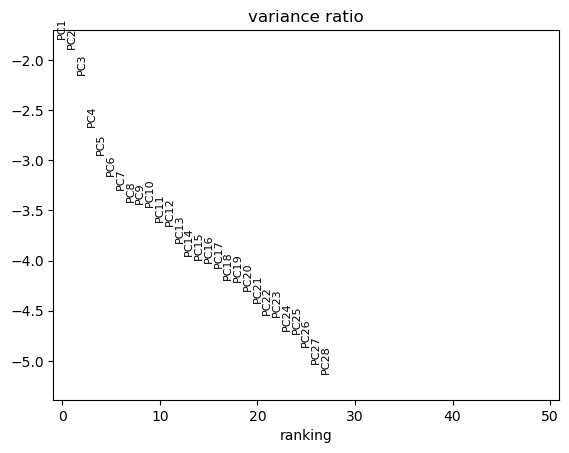

In [11]:
sc.tl.pca(adata)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)

In [ ]:
sc.tl.umap(adata, min_dist=0.1)

In [ ]:
sc.pl.umap(adata, color = 'CellCharter_20')